In [1]:
%%shell
set -e

#---------------------------------------------------#
JULIA_VERSION="1.8.2" # any version ≥ 0.7.0
JULIA_PACKAGES="IJulia BenchmarkTools"
JULIA_PACKAGES_IF_GPU="CUDA" # or CuArrays for older Julia versions
JULIA_NUM_THREADS=2
#---------------------------------------------------#

if [ -z `which julia` ]; then
  # Install Julia
  JULIA_VER=`cut -d '.' -f -2 <<< "$JULIA_VERSION"`
  echo "Installing Julia $JULIA_VERSION on the current Colab Runtime..."
  BASE_URL="https://julialang-s3.julialang.org/bin/linux/x64"
  URL="$BASE_URL/$JULIA_VER/julia-$JULIA_VERSION-linux-x86_64.tar.gz"
  wget -nv $URL -O /tmp/julia.tar.gz # -nv means "not verbose"
  tar -x -f /tmp/julia.tar.gz -C /usr/local --strip-components 1
  rm /tmp/julia.tar.gz

  # Install Packages
  nvidia-smi -L &> /dev/null && export GPU=1 || export GPU=0
  if [ $GPU -eq 1 ]; then
    JULIA_PACKAGES="$JULIA_PACKAGES $JULIA_PACKAGES_IF_GPU"
  fi
  for PKG in `echo $JULIA_PACKAGES`; do
    echo "Installing Julia package $PKG..."
    julia -e 'using Pkg; pkg"add '$PKG'; precompile;"' &> /dev/null
  done

  # Install kernel and rename it to "julia"
  echo "Installing IJulia kernel..."
  julia -e 'using IJulia; IJulia.installkernel("julia", env=Dict(
      "JULIA_NUM_THREADS"=>"'"$JULIA_NUM_THREADS"'"))'
  KERNEL_DIR=`julia -e "using IJulia; print(IJulia.kerneldir())"`
  KERNEL_NAME=`ls -d "$KERNEL_DIR"/julia*`
  mv -f $KERNEL_NAME "$KERNEL_DIR"/julia

  echo ''
  echo "Successfully installed `julia -v`!"
  echo "Please reload this page (press Ctrl+R, ⌘+R, or the F5 key) then"
  echo "jump to the 'Checking the Installation' section."
fi

Unrecognized magic `%%shell`.

Julia does not use the IPython `%magic` syntax.   To interact with the IJulia kernel, use `IJulia.somefunction(...)`, for example.  Julia macros, string macros, and functions can be used to accomplish most of the other functionalities of IPython magics.


In [2]:
versioninfo()

Julia Version 1.8.2
Commit 36034abf260 (2022-09-29 15:21 UTC)
Platform Info:
  OS: Linux (x86_64-linux-gnu)
  CPU: 2 × Intel(R) Xeon(R) CPU @ 2.20GHz
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-13.0.1 (ORCJIT, broadwell)
  Threads: 2 on 2 virtual cores
Environment:
  LD_LIBRARY_PATH = /usr/local/nvidia/lib:/usr/local/nvidia/lib64
  JULIA_NUM_THREADS = 2


In [3]:
using Pkg
Pkg.add("VegaLite")
Pkg.add("VegaDatasets")
Pkg.add("CSV")
Pkg.add("DataFrames")
Pkg.add("DelimitedFiles")

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`
   Resolving package versions...
  No Changes to `~/.julia/environments/v1.8/Project.toml`
  No Changes to `~/.julia/environments/v1.8/Manifest.toml`


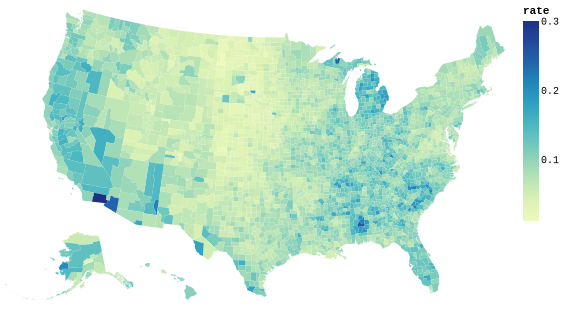

In [4]:
using VegaLite, VegaDatasets

us10m = dataset("us-10m")
unemployment = dataset("unemployment")

@vlplot(
    :geoshape,
    width=500, height=300,
    data={
        values=us10m,
        format={
            type=:topojson,
            feature=:counties
        }
    },
    transform=[{
        lookup=:id,
        from={
            data=unemployment,
            key=:id,
            fields=["rate"]
        }
    }],
    projection={
        type=:albersUsa
    },
    color="rate:q"
)


In [5]:
using CSV
using DataFrames
using DelimitedFiles

# URL do dataset
url = "http://usuarios.upf.br/~holbig/datasets/us_tornado.csv"

# Baixar o arquivo CSV
download(url, "us_tornado.csv")

# Ler os dados do arquivo CSV em um DataFrame
tb = DataFrame(CSV.File("us_tornado.csv"))

## Monte um mapa que identifique as áreas impactadas pelos 10 tornados que causaram mais mortes
tb

Row,yr,mo,dy,date,st,mag,inj,fat,slat,slon,elat,elon,len,wid
,Int64,Int64,Int64,Date,String3,Int64,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Int64
1,1950,1,3,1950-01-03,IL,3,3,0,39.1,-89.3,39.12,-89.23,3.6,130
2,1950,1,3,1950-01-03,MO,3,3,0,38.77,-90.22,38.83,-90.03,9.5,150
3,1950,1,3,1950-01-03,OH,1,1,0,40.88,-84.58,0.0,0.0,0.1,10
4,1950,1,13,1950-01-13,AR,3,1,1,34.4,-94.37,0.0,0.0,0.6,17
5,1950,1,25,1950-01-25,IL,2,0,0,41.17,-87.33,0.0,0.0,0.1,100
6,1950,1,25,1950-01-25,MO,2,5,0,37.6,-90.68,37.63,-90.65,2.3,300
7,1950,1,26,1950-01-26,TX,2,2,0,26.88,-98.12,26.88,-98.05,4.7,133
8,1950,2,11,1950-02-11,TX,2,0,0,29.42,-95.25,29.52,-95.13,9.9,400
9,1950,2,11,1950-02-11,TX,2,5,0,32.35,-95.2,32.42,-95.2,4.6,100


In [8]:
tb2 = sort(tb, :fat, rev=true)
tb2 = select(tb2, :date, :st, :fat, :slat, :slon, :elat, :elon)
tb2 = first(tb2, 10)

Row,date,st,fat,slat,slon,elat,elon
,Date,String3,Int64,Float64,Float64,Float64,Float64
1,2011-05-22,MO,158,37.0524,-94.5932,36.9838,-94.2213
2,1953-06-08,MI,116,43.1,-83.85,43.17,-83.42
3,1953-05-11,TX,114,31.55,-97.15,31.75,-96.88
4,1953-06-09,MA,94,42.47,-72.17,42.3,-71.52
5,1955-05-25,OK,80,36.88,-97.15,37.45,-96.75
6,2011-04-27,AL,72,34.1043,-88.1479,35.0857,-86.1511
7,2011-04-27,AL,64,33.0297,-87.935,33.6311,-86.7436
8,1966-03-03,MS,58,32.18,-90.55,33.37,-87.42
9,1971-02-21,MS,58,32.7,-91.02,35.03,-88.92


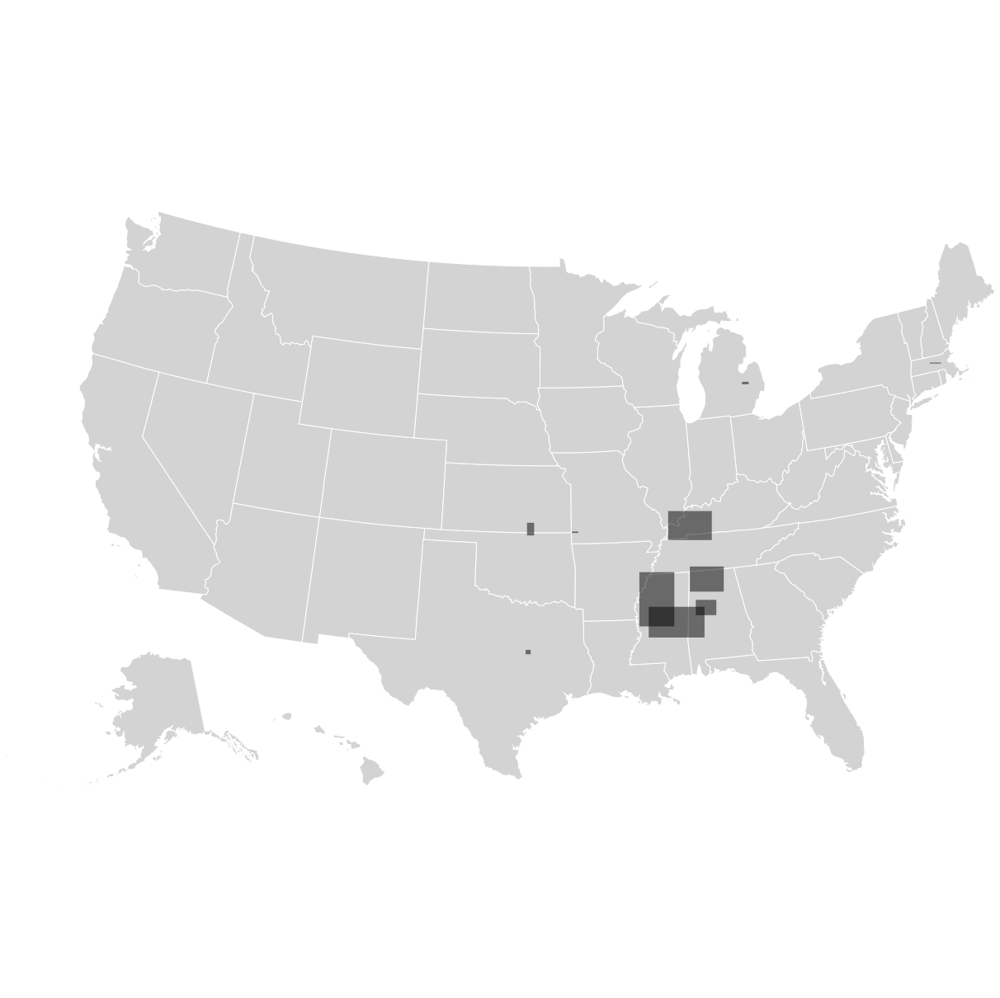

In [11]:
@vlplot(width=1200, height=1200) +
@vlplot(
    mark={
        :geoshape,
        fill=:lightgray,
        stroke=:white
    },
    data={
        values=us10m,
        format={
            type=:topojson,
            feature=:states
        }
    },
    projection={type=:albersUsa},
) +
@vlplot(
    :rect,
    data=tb2,
    longitude = {
      "field" = "slon",
      "type" = "quantitative"
    },
    latitude = {
      "field"= "slat",
      "type"= "quantitative"
    },
    longitude2= {"field" = "elon"},
    latitude2= {"field" = "elat"},
    color={value=:black},
    opacity= {value= 0.5}
)
